In [1]:
using LinearAlgebra, BenchmarkTools, LaTeXStrings, Plots, Plots.PlotMeasures, SparseArrays

In [2]:
function ode_euler(
    f::Function, 
    t0::Real, 
    x0::Vector{<:Real}, 
    Npoints::Integer, 
    h = 1.0e-6)
    tn = t0 .+ collect(0:1:(Npoints-1)) * h
    xn = zeros((length(x0), length(tn)))
    xn[:,1] = x0
    for i in 1:(Npoints-1)
        xn[:, i+1] = xn[:, i] .+ f(tn[i], xn[:, i]) .* h
    end
    return tn, xn
end

function ode_rk2(f::Function, 
    t1::Real, 
    x1::Vector{<:Real}, 
    Npoints::Integer, 
    h = 1.0e-6) 
    tn = t1 .+ collect(0:1:(Npoints-1)) * h
    xn = zeros((length(x1), length(tn)))
    xn[:,1] = x1
    for i in 1:(Npoints-1)
        k1 = f(tn[i], xn[:,i])
        k2 = f(tn[i] + h/2, xn[:, i] .+ k1.*(h/2))
        xn[:, i+1] = xn[:,i] .+ (k1 .+ k2) .*(h/2)
    end 
    return tn, xn
end

function ode_rk4(f::Function, 
    t1::Real, 
    x1::Vector{<:Real}, 
    Npoints::Integer, 
    h = 1.0e-6) 
    tn = t1 .+ collect(0:1:(Npoints-1)) * h
    xn = zeros((length(x1), length(tn)))
    xn[:,1] = x1
    for i in 1:(Npoints-1)
        k1 = f(tn[i], xn[:, i])
        k2 = f(tn[i] + h/2, xn[:, i] .+ k1.*(h/2))
        k3 = f(tn[i] + h/2, xn[:,i] .+ k2 .*(h/2))
        k4 = f(tn[i] + h, xn[:, i] .+ k3 .* h)
        xn[:, i+1] = xn[:, i] .+ (k1 .+ (2.0 .* k2) .+ (2.0 .* k3) .+ k4).*(h/6)
    end
    return tn, xn
end


ode_rk4 (generic function with 2 methods)

In [3]:
function butterfly3d(v, σ::Real, ρ::Real, β::Real)
    return [σ*(v[2]-v[1]), v[1]*(ρ - v[3])-v[2], v[1]*v[2]-β*v[3]]
end

butterfly3d (generic function with 1 method)

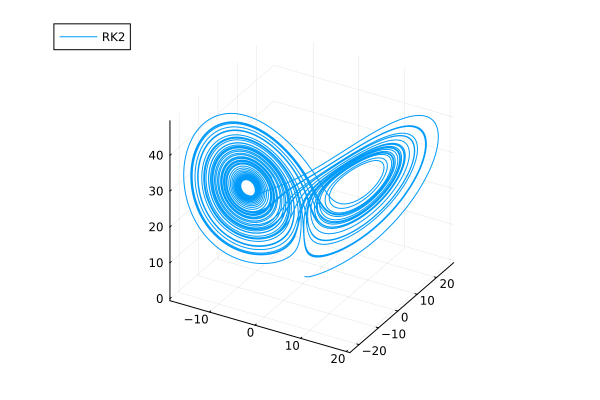

In [4]:
tn, xn = ode_rk2((t, x)->butterfly3d(x, 10, 28, 8/3), 0.0, [0.0, 1.0, 1.0], 50000, 1.0e-3)
plot(xn[1,:], xn[2,:], xn[3,:], label="RK2")
# plot(xn[1,:], xn[2,:], xn[3,:], dpi=300, label="RK2")
# savefig("lorentz_rk2.png")

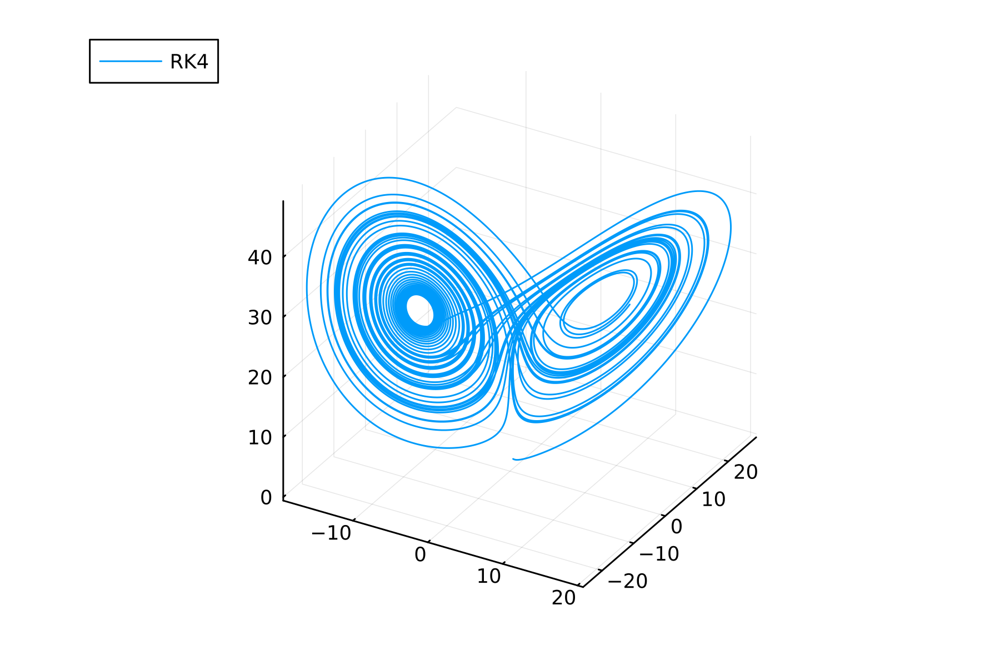

In [5]:
tn, xn = ode_rk4((t, x)->butterfly3d(x, 10, 28, 8/3), 0.0, [0.0, 1.0, 1.0], 50000, 1.0e-3)
plot(xn[1,:], xn[2,:], xn[3,:],dpi=300, label = "RK4")
# plot(xn[1,:], xn[2,:], xn[3,:], label = "RK4")
# savefig("lorentz_rk4.png")

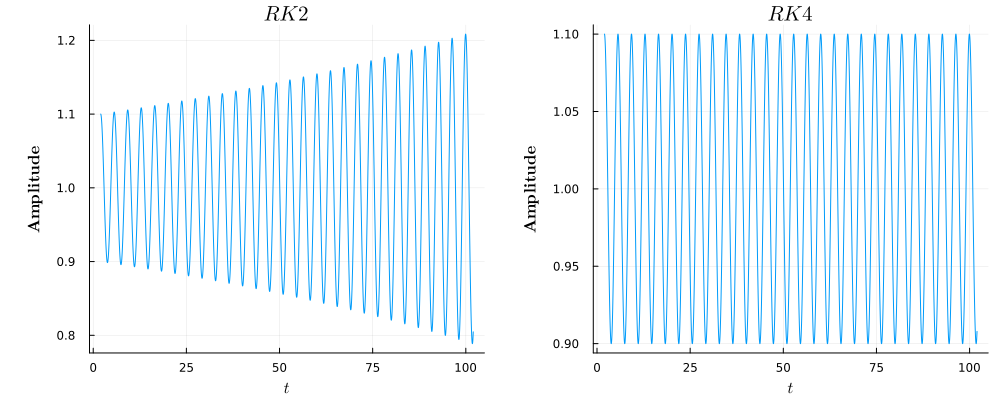

In [6]:
function sho1d(y::Vector{<:Real}, k::Real, x0=0.0)
    return [y[2], -k*(y[1]-x0)]
end
tn1, xn1 = ode_rk2((t, y)->sho1d(y, 3, 1.0), 2.0, [1.1, 0.0], 10000, 1.0e-2)
tn2, xn2 = ode_rk4((t, y)->sho1d(y, 3, 1.0), 2.0, [1.1, 0.0], 10000, 1.0e-2)
p1=plot(tn1, xn1[1,: ], label = :none, xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"RK2", size=(400, 350))

p2=plot(tn2, xn2[1,: ], label = :none, xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"RK4", size=(400, 350))
plot(p1, p2, size=(1000, 400), left_margin = [10mm 10mm], bottom_margin = 15px)
#savefig("sho1d_rk.png")

λ= 0.015, ω = 0.9998874936711629


λ= 0.3, ω = 0.0 + 0.264575131106459im


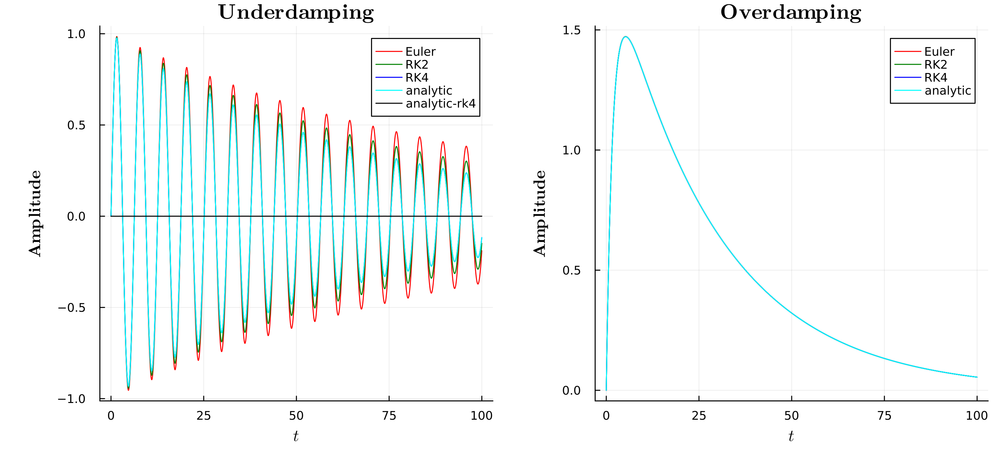

In [7]:
function dho1d(y::Vector{<:Real}, m=1.0, k=1.0, γ=1.0)
    return [y[2], -γ/m *y[2] - k/m*y[1]]
end

m, k, γ = 1.0, 1.0, 0.03
tn1, xn1 = ode_euler((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)
tn2, xn2 = ode_rk2((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)
tn3, xn3 = ode_rk4((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)

p1=plot(tn1, xn1[1,: ], label = "Euler", xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"\textbf{Underdamping}", lc=:red)#, size=(400, 350))
plot!(tn2, xn2[1,: ], label = "RK2", lc=:green)

plot!(tn3, xn3[1,: ], label = "RK4", lc=:blue)#, xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"RK4", size=(400, 350))


λ = γ/(2*m)
ω = sqrt(k/m-γ^2/4/m)
rk2 = exp.(-λ .* tn3) .* sin.(ω .* tn3)
plot!(tn3, rk2, lc=:cyan, label = "analytic")
plot!(tn3, rk2-xn3[1, :], lc=:black, label = "analytic-rk4")
println("λ= $λ, ω = $ω")

m, k, γ = 1, 0.02, 0.6
tn1, xn1 = ode_euler((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)
tn2, xn2 = ode_rk2((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)
tn3, xn3 = ode_rk4((t, y)->dho1d(y, m, k, γ), 0.0, [0.0, 1.0], 10000, 1.0e-2)
p2=plot(tn1, xn1[1,: ], label = "Euler", xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"\textbf{Overdamping}", lc=:red)#, size=(400, 350))
plot!(tn2, xn2[1,: ], label = "RK2", lc=:green)
plot!(tn3, xn3[1,: ], label = "RK4", lc=:blue)#


λ = γ/(2*m)
ω = sqrt(k/m+0.0im-γ^2/4/m)
println("λ= $λ, ω = $ω")
rk2 = 1.88982*exp.(-λ .* tn3) .* (exp.(imag(ω) .* tn3) - exp.(-imag(ω) .* tn3)) 
plot!(tn3, rk2, lc=:cyan, label = "analytic")
plot(p1, p2, dpi=300, left_margin = [10mm 10mm], bottom_margin = 15px, size=(1000, 450))

#savefig("dho1d_rk.png")

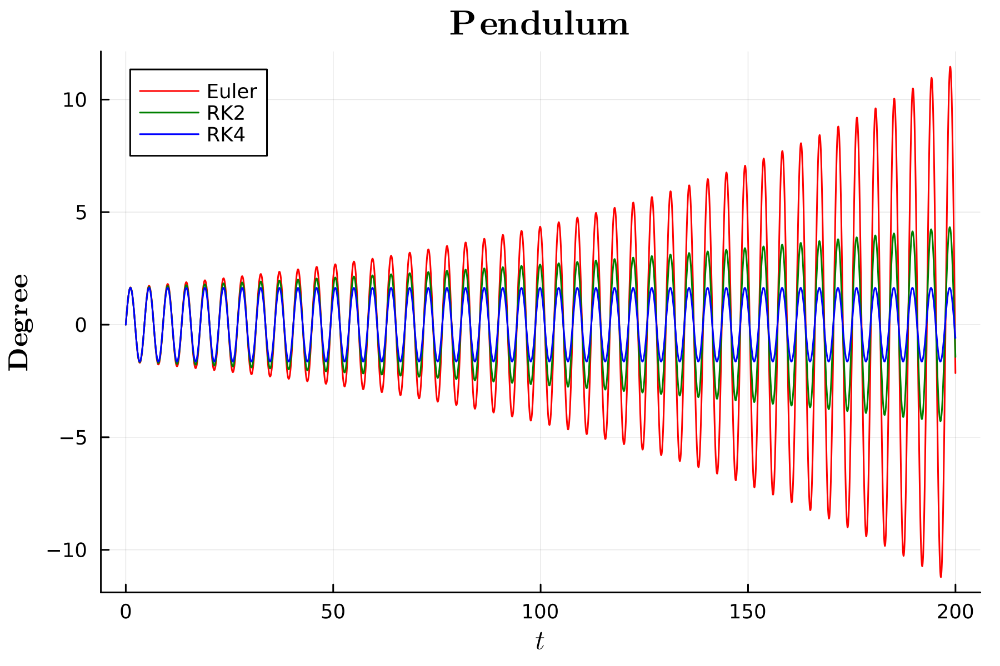

In [8]:
function pendulum(y::Vector{<:Real}, g=9.8, l=2)
    return [y[2], -g/l*sin(y[1])]
end
g, l = 9.8, 5.0
tn1, xn1 = ode_euler((t, y)->pendulum(y, g, l), 0.0, [0.0, 0.04], 20000, 1.0e-2)
tn2, xn2 = ode_rk2((t, y)->pendulum(y, g, l), 0.0, [0.0, 0.04], 20000, 1.0e-2)
tn3, xn3 = ode_rk4((t, y)->pendulum(y, g, l), 0.0, [0.0, 0.04], 20000, 1.0e-2)

p1=plot(tn1, (180.0/π).* xn1[1,: ], label = "Euler", xlabel = L"t", ylabel = L"\textbf{Degree}", title = L"\textbf{Pendulum}", lc=:red, dpi=300)#, size=(400, 350))
plot!(tn2, (180.0/π).* xn2[1,: ], label = "RK2", lc=:green)

plot!(tn3, (180.0/π).* xn3[1,: ], label = "RK4", lc=:blue)#, xlabel = L"t", ylabel = L"\textbf{Amplitude}", title = L"RK4", size=(400, 350))
#savefig("ode_pendulum.png")


In [162]:
function twobody(m1::Real, m2::Real, G::Real, xx::Vector{<:Real})
    x, y, v, w = xx[1:3], xx[4:6], xx[7:9], xx[10:12]
    r = y .- x
    rn = norm(r)^3
    k2 = (G*m2/rn) 
    k1 = (G*m1/rn) 
    A = zeros(12, 12)
    A[1:3, 7:9] = [1 0 0; 0 1 0; 0 0 1]
    A[4:6, 10:12] = [1 0 0; 0 1 0; 0 0 1]
    A[7:9, 1:3] = [-k2 0 0; 0 -k2 0; 0  0 -k2]
    A[7:9, 4:6] = [k2 0 0; 0 k2 0; 0 0 k2]
    A[10:12, 4:6] = [-k1 0 0; 0 -k1 0; 0 0 -k1]
    A[10:12, 1:3] = [k1 0 0; 0 k1 0; 0 0 k1]

    return A*xx
end

twobody (generic function with 2 methods)

In [163]:
me = 5.972e24
ms= 2.0e30
G =  6.67384e−11
v1 = 29.78e3
r0 =147.10e9
A=twobody(ms, me, G,[0, 0, 0, r0, 0, 0, 0, 0, 0, 0, v1, 0], true)
tn3, xn3 = ode_rk4((t, y)->twobody(ms, me, G, y), 0.0, [0, 0, 0, r0, 0, 0, 0, 0, 0, 0, v1, 0], 8760, 3600)

([0.0, 3600.0, 7200.0, 10800.0, 14400.0, 18000.0, 21600.0, 25200.0, 28800.0, 32400.0  …  3.15e7, 3.15036e7, 3.15072e7, 3.15108e7, 3.15144e7, 3.1518e7, 3.15216e7, 3.15252e7, 3.15288e7, 3.15324e7], [0.0 0.11935626821384132 … 31476.397805634315 31597.024995398144; 0.0 2.899602855623165e-5 … 2.642275721353609e6 2.642298743041862e6; … ; 29780.0 29779.99190778428 … 27642.469162550784 27634.26412780587; 0.0 0.0 … 0.0 0.0])

In [164]:
A[10:12, 1:6]

3×6 Matrix{Float64}:
 4.19341e-14  0.0          0.0          …   0.0           0.0
 0.0          4.19341e-14  0.0             -4.19341e-14   0.0
 0.0          0.0          4.19341e-14      0.0          -4.19341e-14

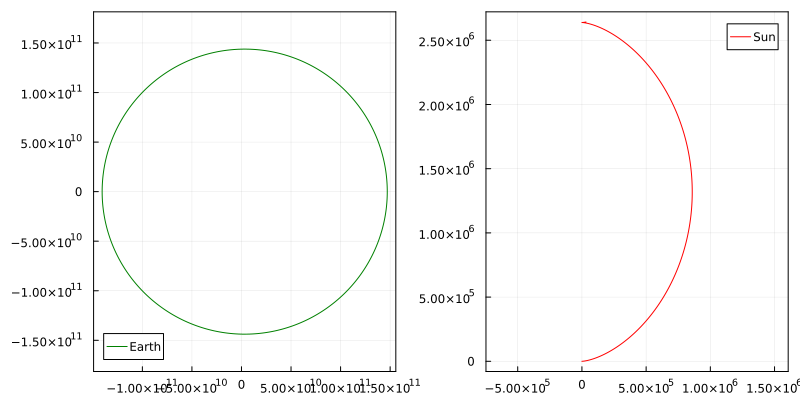

In [174]:
p1 = plot(xn3[4, : ], xn3[5, :], aspect_ratio = :equal, label="Earth", lc=:green, frame=:box)
p2 = plot(xn3[1, : ], xn3[2, :], aspect_ratio = :equal, label = "Sun", lc=:red, frame = :box)
plot(p1, p2, size = [800, 400])

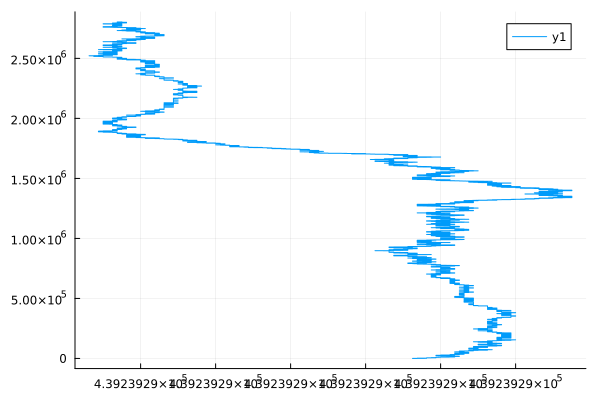

In [179]:
com = ((ms .* xn3[1:3, :]) .+ (me .* xn3[4:6, :])) ./ (ms+me)
plot(com[1,:], com[2, :])#, aspect_ratio = :equal)

In [51]:
Diagonal([1,2,3])

3×3 Diagonal{Int64, Vector{Int64}}:
 1  ⋅  ⋅
 ⋅  2  ⋅
 ⋅  ⋅  3

In [148]:
24*365

8760